                                                  COCA COLA STOCK ANALYSIS

Reading Data and Basic Stats

In [6]:
# importing libraries
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")
%matplotlib inline
from datetime import datetime, timedelta

In [9]:
# For reading stock data from yahoo
from pandas_datareader.data import DataReader

In [10]:
# For time stamps
from datetime import datetime
from math import sqrt
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

In [11]:
#ignore the warnings
import warnings
warnings.filterwarnings('ignore')

In [12]:
# importing dataset
KO_Data = pd.read_csv('Coca-Cola_stock_history.csv')

In [6]:
# importing dataset
ko_info = pd.read_csv('Coca-Cola_stock_info.csv', header=None, names=(['Description','Information']))
ko_info.dropna()
ko_info.drop(ko_info.loc[ko_info['Information']=='nan'].index, inplace=True)
ko = ko_info.sort_values('Information').style
ko

,Description,Information
49,gmtOffSetMilliseconds,-18000000
145,bid,0
138,ask,0
77,heldPercentInsiders,0.00636
68,sharesPercentSharesOut,0.0074
100,shortPercentOfFloat,0.0074
108,trailingAnnualDividendYield,0.027917083
147,dividendYield,0.028099999
29,returnOnAssets,0.07831
75,SandP52WeekChange,0.15025425


In [7]:
KO_Data.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


In [8]:
ko_info.head()

,Description,Information
0,Key,Value
1,zip,30313
2,sector,Consumer Defensive
3,fullTimeEmployees,80300
4,longBusinessSummary,"The Coca-Cola Company, a beverage company, man..."


In [9]:
KO_Data.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,15311.000000,15311.000000,15311.000000,15311.000000,1.531100e+04,15311.000000,15311.000000
mean,11.812883,11.906708,11.717375,11.815409,9.139213e+06,0.001678,0.001110
std,15.025726,15.133336,14.915580,15.026316,7.957947e+06,0.021302,0.049148
min,0.037154,0.037279,0.034890,0.037028,7.680000e+04,0.000000,0.000000
25%,0.238453,0.240305,0.236415,0.238312,2.889600e+06,0.000000,0.000000
50%,4.935146,4.980985,4.884242,4.937339,7.708800e+06,0.000000,0.000000
75%,17.383926,17.612844,17.168283,17.415106,1.307130e+07,0.000000,0.000000
max,66.037933,66.235058,64.776308,65.259270,1.241690e+08,0.440000,3.000000


In [10]:
ko_info.describe()

,Description,Information
count,154,124
unique,154,111
top,Key,1638230400
freq,1,3


Data Cleaning

In [11]:
# Check for missing values
print(KO_Data.isnull().sum())
# Fill missing numerical values with the column mean
KO_Data.fillna(method='ffill', inplace=True) 
# Forward fill for stock data continuity
KO_Data.fillna(0, inplace=True) 
# Replace remaining missing dividends/splits with 0
# Confirm no missing values remain
print(KO_Data.isnull().sum())

Date            0
Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64
Date            0
Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64


Data Visualisation

In [12]:
# Add Moving Averages
KO_Data['MA_20'] = KO_Data['Close'].rolling(window=20).mean()
KO_Data['MA_50'] = KO_Data['Close'].rolling(window=50).mean()
# Add Daily Returns
KO_Data['Daily_Return'] = KO_Data['Close'].pct_change()
# Add Volatility (standard deviation of returns over a rolling window)
KO_Data['Volatility'] = KO_Data['Daily_Return'].rolling(window=20).std()
# Drop rows with NA due to rolling calculations
KO_Data.dropna(inplace=True)
print(KO_Data.head())

          Date      Open      High       Low     Close   Volume  Dividends  \
49  1962-03-13  0.046416  0.046789  0.046416  0.046789  1344000   0.001563   
50  1962-03-14  0.046789  0.046976  0.046603  0.046852  1689600   0.000000   
51  1962-03-15  0.046852  0.046976  0.046603  0.046603   883200   0.000000   
52  1962-03-16  0.046603  0.046789  0.046603  0.046603   768000   0.000000   
53  1962-03-19  0.046603  0.047101  0.046603  0.046852   921600   0.000000   

    Stock Splits     MA_20     MA_50  Daily_Return  Volatility  
49             0  0.045788  0.046525      0.015962    0.013223  
50             0  0.045797  0.046461      0.001334    0.013226  
51             0  0.045836  0.046415     -0.005320    0.012546  
52             0  0.045889  0.046362      0.000000    0.012460  
53             0  0.045953  0.046336      0.005348    0.012491  


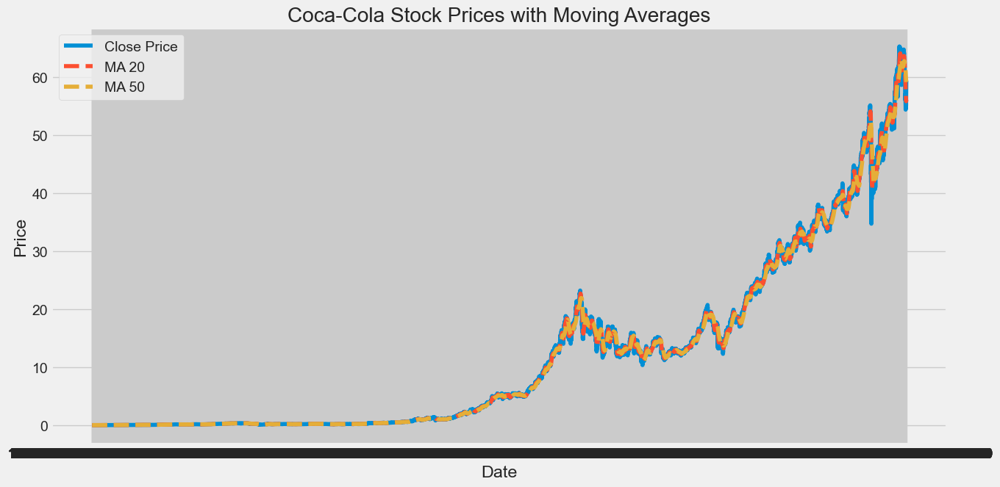

In [13]:
# Line plot for stock prices
plt.figure(figsize=(14, 7))
plt.plot(KO_Data['Date'], KO_Data['Close'], label='Close Price')
plt.plot(KO_Data['Date'], KO_Data['MA_20'], label='MA 20', linestyle='--')
plt.plot(KO_Data['Date'], KO_Data['MA_50'], label='MA 50', linestyle='--')
plt.title('Coca-Cola Stock Prices with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

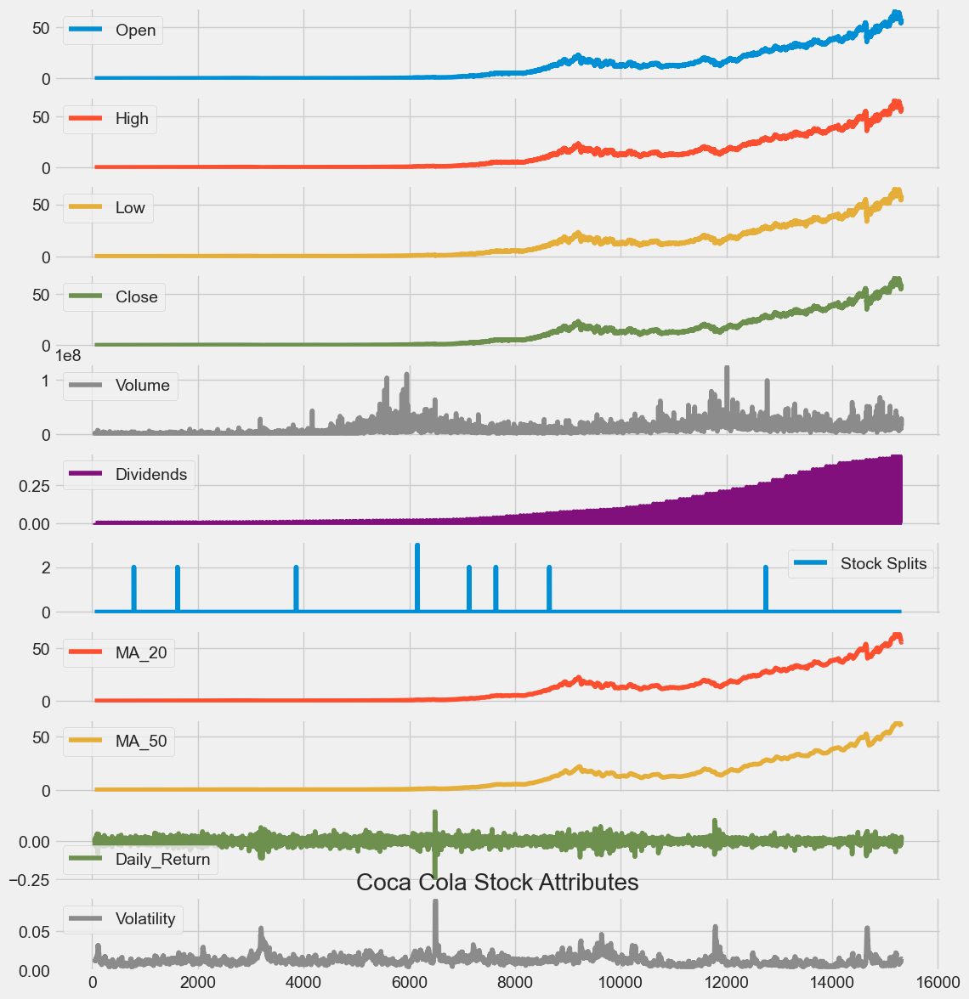

In [14]:
# subplots for open, high, low, close and volume
KO_Data.plot(subplots = True, figsize = (12,14))
plt.title('Coca Cola Stock Attributes')
plt.show()

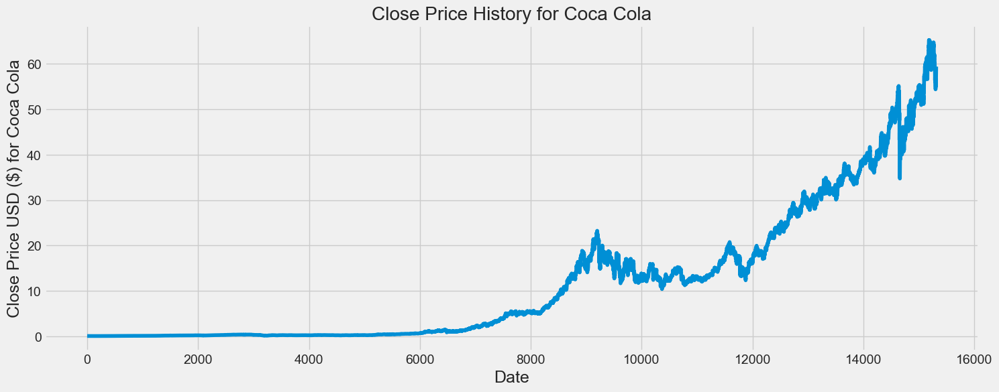

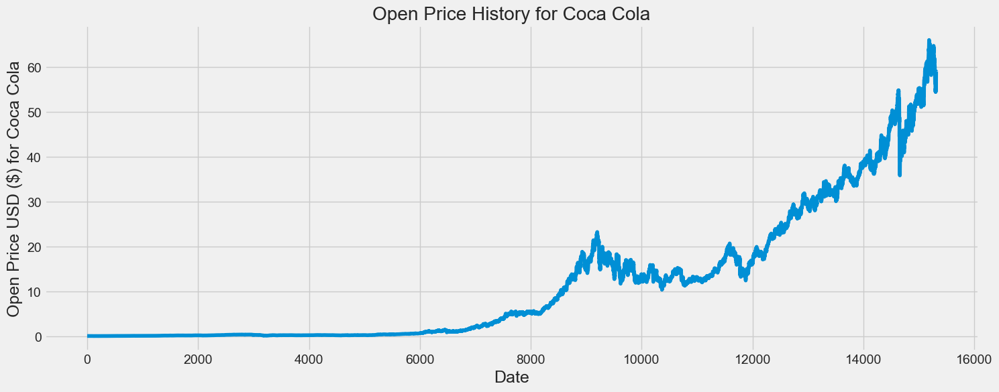

In [13]:
# ploting the line graph for close and open 
plot_close_val(KO_Data, 'Close', 'Coca Cola')
plot_close_val(KO_Data, 'Open', 'Coca Cola')

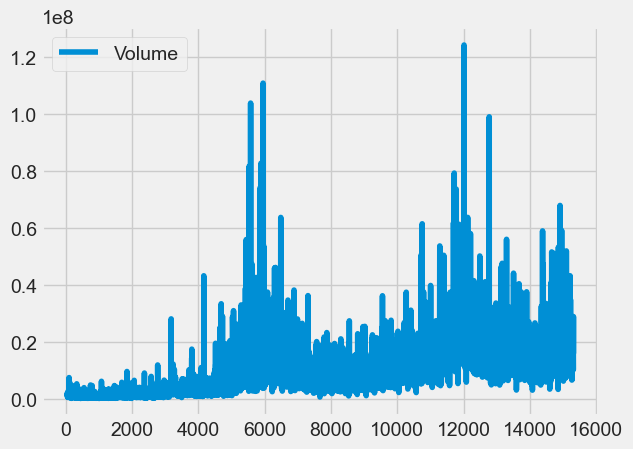

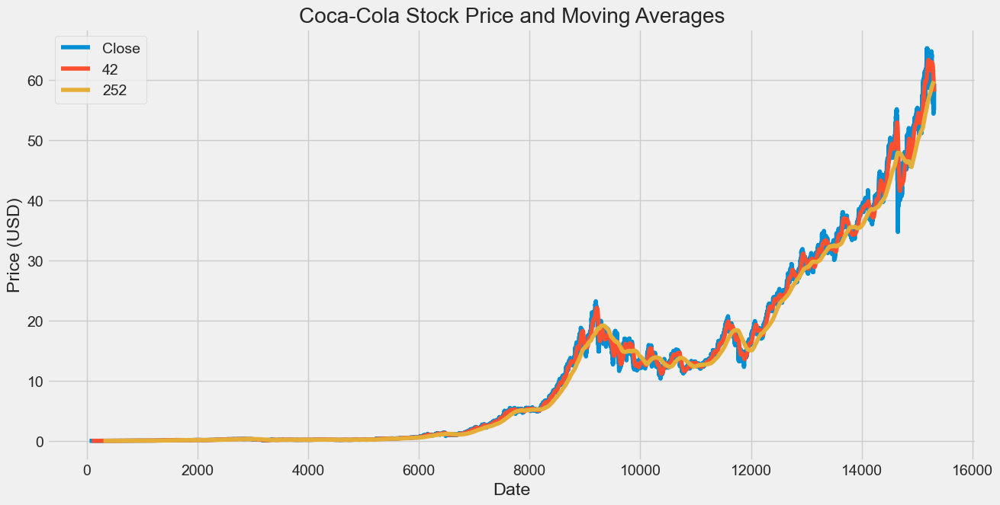

In [19]:
# Assuming KO_Data is your DataFrame and 'Close' column contains the adjusted closing price
adj_close_px = KO_Data['Close']

# Short moving window rolling mean (e.g., 40 days)
KO_Data['42'] = adj_close_px.rolling(window=40).mean()

# Long moving window rolling mean (e.g., 252 days)
KO_Data['252'] = adj_close_px.rolling(window=252).mean()

# Plot adjusted close, short-term MA, and long-term MA
KO_Data[['Close', '42', '252']].plot(figsize=(14, 7), title='Coca-Cola Stock Price and Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.grid(True)
plt.show()


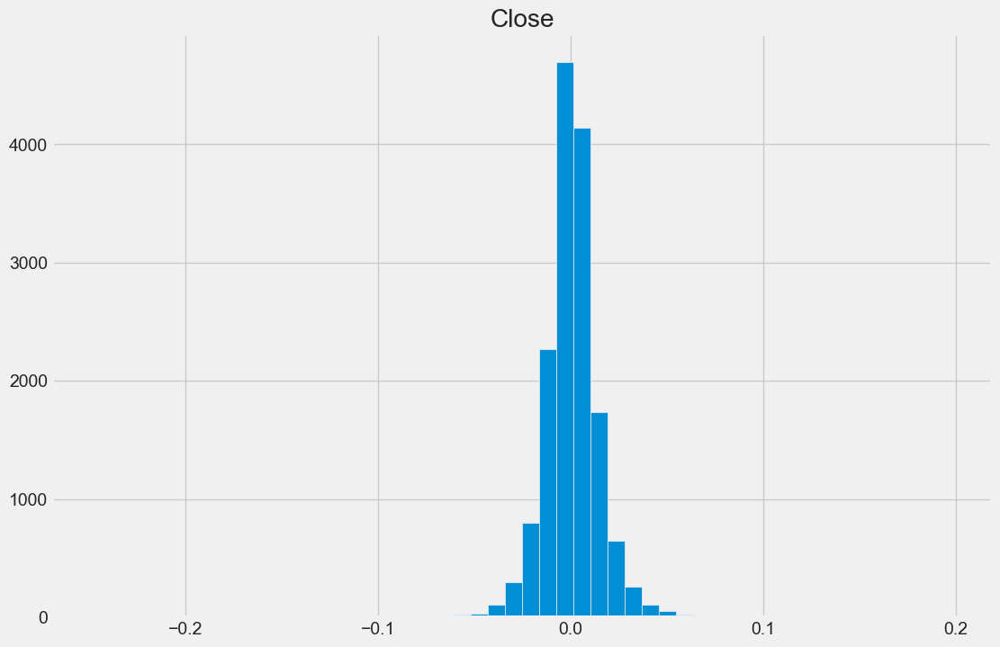

In [20]:
daily_close_px = KO_Data[['Close']]
# Calculate the daily percentage change for `daily_close_px
daily_pct_change = daily_close_px.pct_change()
# Plot the distributions
daily_pct_change.hist(bins=50, sharex=True, figsize=(12, 8))
# Show the resulting plot
plt.show()

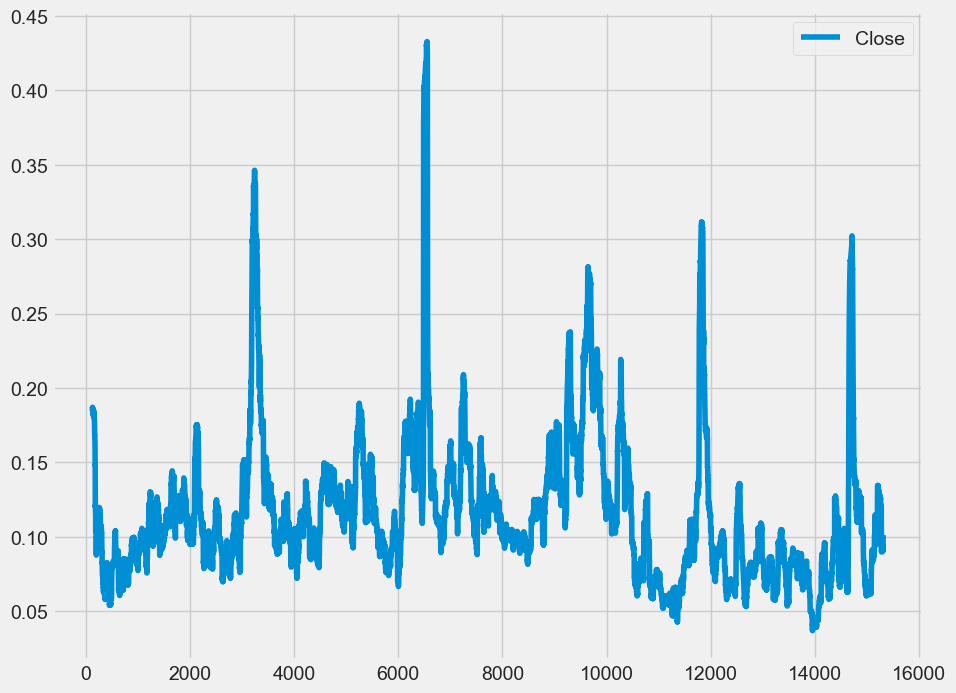

In [21]:
# Define the minumum of periods to consider
min_periods=75
# Calculate the volatility
vol=daily_pct_change.rolling(min_periods).std()*np.sqrt(min_periods)
# Plot the volatility
vol.plot(figsize=(10,8))
# Show the plot
plt.show()

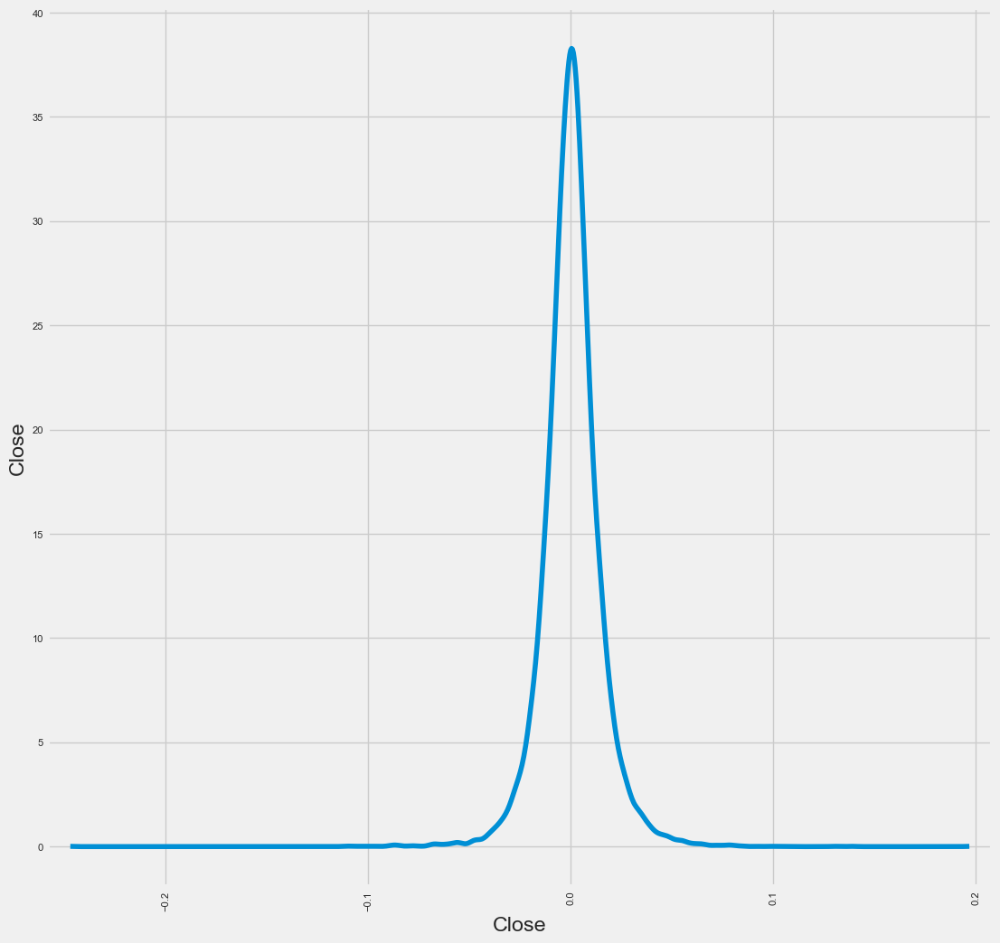

In [22]:
# Plot a scatter matrix with the `daily_pct_change` data
pd.plotting.scatter_matrix(daily_pct_change, diagonal='kde', alpha=0.1, figsize=(12,12))

# Show the plot
plt.show()

In [23]:
# Isolate the adjusted closing prices
adj_close_px = KO_Data['Close']
# Calculate the moving average
moving_avg = adj_close_px.rolling(window=40).mean()
# Inspect the result
moving_avg[-10:]

15301    59.573229
15302    59.329031
15303    59.103823
15304    58.921440
15305    58.725320
15306    58.504966
15307    58.298918
15308    58.171838
15309    58.088689
15310    58.030935
Name: Close, dtype: float64

Regression Analysis

In [24]:
from sklearn.model_selection import train_test_split
# Features and target
features = ['Open', 'High', 'Low', 'Volume', 'MA_20', 'MA_50', 'Daily_Return', 'Volatility']
target = 'Close'
X = KO_Data[features]
y = KO_Data[target]
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=False)

In [25]:
# importing libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [26]:
# Initialize the model
model = RandomForestRegressor(n_estimators=100, random_state=42)

In [27]:
# Train the model
model.fit(X_train, y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [28]:
# Predict on test set
y_pred = model.predict(X_test)

In [29]:
# Evaluate model
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

In [30]:
# MSE and MAE
print(f"Mean Squared Error: {mse}")
print(f"Mean Absolute Error: {mae}")

Mean Squared Error: 327.3790299668709
Mean Absolute Error: 14.650201167360517


In [31]:
# Evaluate predictions (e.g., using R²)
from sklearn.metrics import r2_score
print("Test R²:", r2_score(y_test, y_pred))

Test R²: -1.852076204647004


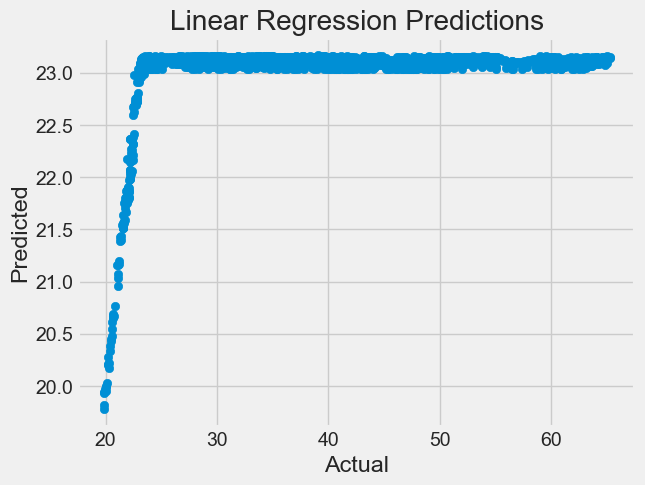

In [32]:
# ploting scatterplot for Linear Regression Predictions
plt.scatter(y_test, y_pred)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Linear Regression Predictions")
plt.show()

In [33]:
# Add constant for intercept
import statsmodels.api as sm
X = sm.add_constant(X)

In [34]:
# Fit the model
model = sm.OLS(y, X).fit()

In [35]:
# Summary of regression
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  Close   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 5.614e+07
Date:                Thu, 10 Jul 2025   Prob (F-statistic):               0.00
Time:                        16:17:05   Log-Likelihood:                 15504.
No. Observations:               15262   AIC:                        -3.099e+04
Df Residuals:                   15253   BIC:                        -3.092e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.0018      0.002     -0.926   

In [36]:
# importing libraries
from ydata_profiling import ProfileReport
import ydata_profiling

Summary

In [37]:
# Generating summary report
profile=ProfileReport(KO_Data, title='Coca Cola Stock Analysis')

In [38]:
# Summary report
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/14 [00:00<?, ?it/s]
100%|██████████| 14/14 [00:02<00:00,  5.63it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [39]:
# Generating summary report
profile=ProfileReport(ko_info, title='Coca Cola Stock Info')

In [40]:
# Summary report
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


%|          | 0/2 [00:00<?, ?it/s]
%|█████     | 1/2 [00:00<00:00,  2.33it/s]
100%|██████████| 2/2 [00:00<00:00,  3.30it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Live Prediction System

In [57]:
# importing details of Coca-Cola
ticker = 'KO'
start_date = datetime.today() - timedelta(days=365 * 2)  # last 2 years
end_date = datetime.today()
data = yf.download(ticker, start=start_date, end=end_date)

[*********************100%***********************]  1 of 1 completed


In [59]:
import yfinance as yf
import statsmodels.api as sm

# Fetch latest stock data
live_data = yf.download(ticker, period='1d', interval='1m')

# Feature engineering
live_data['MA_20'] = live_data['Close'].rolling(window=20).mean()
live_data['MA_50'] = live_data['Close'].rolling(window=50).mean()
live_data['Daily_Return'] = live_data['Close'].pct_change()
live_data['Volatility'] = live_data['Daily_Return'].rolling(window=20).std()

# Clean missing data
live_data.fillna(0, inplace=True)

# Select latest row and features
latest_features = live_data[features].iloc[-1:].dropna()

# Add constant column explicitly
latest_features = sm.add_constant(latest_features, has_constant='add')

# Prediction
live_prediction = model.predict(latest_features)

print(f"Predicted Closing Price: {live_prediction[0]:.2f}")

[*********************100%***********************]  1 of 1 completed


Predicted Closing Price: 69.70
